<a href="https://colab.research.google.com/github/dimasprd/College-Final-Project/blob/main/Notebooks/001_AI_PREDICTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install segypy
import segypy
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow
from scipy.signal import butter, filtfilt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score, max_error, mean_squared_error
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dropout, Dense, LSTM
from keras.layers.convolutional import Conv1D, MaxPooling1D, AveragePooling1D
from tensorflow.keras import layers

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 200
# plt.style.use('seaborn')

from google.colab import drive
drive.mount('/content/drive')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dataset_F032 = pd.read_excel(
    '/content/drive/My Drive/Final Project/Datasets/F032.xlsx'
)
dataset_F034 = pd.read_excel(
    '/content/drive/My Drive/Final Project/Datasets/F034.xlsx'
)
dataset_F021 = pd.read_excel(
    '/content/drive/My Drive/Final Project/Datasets/F021.xlsx'
)
dataset_F061 = pd.read_excel(
    '/content/drive/My Drive/Final Project/Datasets/F061.xlsx'
)

In [ ]:
print(
    'Well F032: ', dataset_F032[dataset_F032['TWT']==488].index[0],
    dataset_F032[dataset_F032['TWT']==1205.4].index[0]
)


print(
    'Well F034: ', dataset_F034[dataset_F034['TWT']==475.6].index[0],
    dataset_F034[dataset_F034['TWT']==1226].index[0]
)


print(
    'Well F021: ', dataset_F021[dataset_F021['TWT']==585.6].index[0],
    dataset_F021[dataset_F021['TWT']==1227.8].index[0]
)


print(
    'Well F061: ', dataset_F061[dataset_F061['TWT']==599.4].index[0],
    dataset_F061[dataset_F061['TWT']==1256.6].index[0]
)

Well F032:  2440 6027
Well F034:  2378 6130
Well F021:  2928 6139
Well F061:  2997 6283


In [ ]:
data_F032 = dataset_F032[2440:6027]
data_F034 = dataset_F034[2378:6130]
data_F021 = dataset_F021[2928:6139]
data_F061 = dataset_F061[2997:6283]

In [ ]:
def normalize(data, data_norm=None, normalize=True):
    '''
    to normalize data
    
    params:
    
    data: data to normalize. should in 2d array
    data_norm: data to unnormalize.
    normalize: (True, False). if True, 
    data will be normalize and "data_norm" param is unnecessary
    if False, "data_norm" is the data to be normalize 
    and "data" param is necessary
    '''
    min_val = min(data.values.flatten())
    max_val = max(data.values.flatten())
    
    if normalize:
        return (data - min_val)/(max_val - min_val)
    else:
        return data_norm*(max_val - min_val) + min_val

    
def scaling_col_values(data, min_val=None, max_val=None):
    '''
    function to normalize certain column values in DataFrame
    '''
    return (data - min_val)/(max_val - min_val)


def scaling_df_values(df):
    '''
    function to normalize all columns values in DataFrame
    '''
    df_scaled = df.copy()
    for i in range(len(df_scaled.columns)):
        min_val = min(df_scaled[df_scaled.columns[i]])
        max_val = max(df_scaled[df_scaled.columns[i]])
        df_scaled[df_scaled.columns[i]] = scaling_col_values(
            df_scaled[df_scaled.columns[i]], 
            min_val=min_val, max_val=max_val
        )
    return df_scaled


def absolute_error(actual_data, prediction_data):
    '''
    function to calculate absolute error
    '''
    return abs(actual_data - prediction_data)


def load_data(data):
    '''
    function to load seismic data
    '''
    read = segypy.readSegy(data)
    return read[0]

def filter(data, order=5, cutoff=10, fs=1000/2):
    df = pd.DataFrame(data).apply(
        lambda data: filtfilt(
            butter(order, (cutoff / (0.5 * fs)), 
                   btype='low', analog=False)[0], 
            butter(order, (cutoff / (0.5 * fs)), 
                   btype='low', analog=False)[1],
            data
        )
    )
    return df

In [ ]:
features = ['LFM_PW', 'SEISMIC', 'QUAD', 'AMP_ENV']
target = ['TRUE_AI']

In [ ]:
training_wells = [data_F021, data_F034, data_F032]
testing_wells = [data_F061]

training_wells_comp = pd.concat(training_wells)
training_wells_comp = training_wells_comp.sample(frac=1)

testing_well_comp = testing_wells[0]

X_train = training_wells_comp[features]
y_train = training_wells_comp[target]

X_test = testing_well_comp[features]
y_test = testing_well_comp[target]

In [ ]:
scaler_x = MinMaxScaler(feature_range=(0,1))
scaler_x.fit(X_train)
X_train_scaled = scaler_x.transform(X_train)
X_test_scaled = scaler_x.transform(X_test)

scaler_y = MinMaxScaler(feature_range=(0,1)).fit(y_train)
y_train_scaled = scaler_y.transform(y_train) 
y_test_scaled = scaler_y.transform(y_test)

In [ ]:
X_train_scaled = pd.DataFrame(
    X_train_scaled,
    columns = X_train.columns
)

y_train_scaled = pd.DataFrame(
    y_train_scaled,
    columns = y_train.columns
)


X_test_scaled = pd.DataFrame(
    X_test_scaled,
    columns = X_test.columns
)

y_test_scaled = pd.DataFrame(
    y_test_scaled,
    columns = y_test.columns
)

# Convolutional Neural Network (CNN)

In [ ]:
X_train_scaled_cnn = np.array(X_train_scaled).reshape(
    X_train_scaled.shape[0], X_train_scaled.shape[1], 1
)
X_test_scaled_cnn = np.array(X_test_scaled).reshape(
    X_test_scaled.shape[0], X_test_scaled.shape[1], 1
)

y_train_scaled_cnn = np.array(y_train_scaled).reshape(-1, 1, 1)
y_test_scaled_cnn = np.array(y_test_scaled).reshape(-1, 1, 1)

batch_size = 32
num_classes = 1
epochs = 800

input_shape=(X_train_scaled_cnn.shape[1], 1)

In [ ]:
model_cnn = Sequential()
input_shape=(X_train_scaled_cnn.shape[1], 1)

model_cnn.add(
    (
        Conv1D(
            256, kernel_size=2, padding = 'same',
            activation='relu', input_shape=input_shape))
)
model_cnn.add(
    (MaxPooling1D(pool_size=2, padding='same'))

)
model_cnn.add(
    Conv1D(
        256, kernel_size=2, padding = 'same',
        activation='relu', input_shape=input_shape)
) 

model_cnn.add(Dropout(0.2))
model_cnn.add(
    Conv1D(256, kernel_size=2,padding = 'same',activation='relu')
)
model_cnn.add(
    keras.layers.MaxPooling1D(pool_size=2, name="MaxPooling1D")
)
model_cnn.add(keras.layers.Flatten())
model_cnn.add(Dense(256, activation='relu'))
model_cnn.add(Dense(256, activation='relu'))
model_cnn.add(Dense(128, activation='relu'))
model_cnn.add(Dense(64, activation='relu'))

model_cnn.add(Dense(num_classes, activation='linear'))
model_cnn.compile(loss="mse", optimizer="adam")
model_cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4, 256)            768       
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2, 256)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 2, 256)            131328    
                                                                 
 dropout (Dropout)           (None, 2, 256)            0         
                                                                 
 conv1d_2 (Conv1D)           (None, 2, 256)            131328    
                                                                 
 MaxPooling1D (MaxPooling1D)  (None, 1, 256)           0         
                                                        

In [ ]:
history_cnn = model_cnn.fit(
    X_train_scaled_cnn, y_train_scaled_cnn, 
    epochs=epochs, batch_size=batch_size, validation_split = 0.2
)
model_cnn.evaluate(X_test_scaled_cnn, y_test_scaled_cnn)

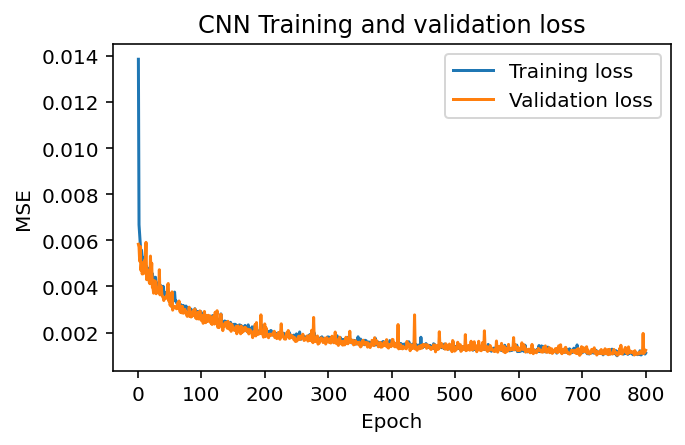

In [ ]:
plt.rcParams['figure.dpi'] = 144
loss = history_cnn.history['loss']
val_loss = history_cnn.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(5, 3))
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('CNN Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Predicting
pred_cnn_scaled = model_cnn.predict(X_test_scaled_cnn)

# Inverse transform
temp1 = pred_cnn_scaled.reshape((pred_cnn_scaled.shape[0], 1))
pred_cnn = scaler_y.inverse_transform(temp1)
pred_cnn = np.array(pred_cnn)

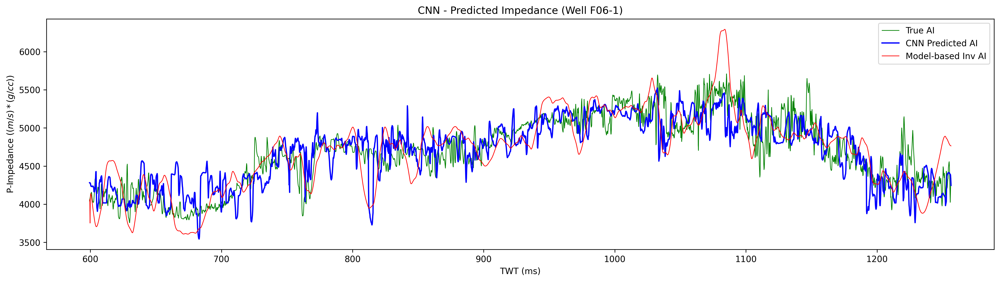

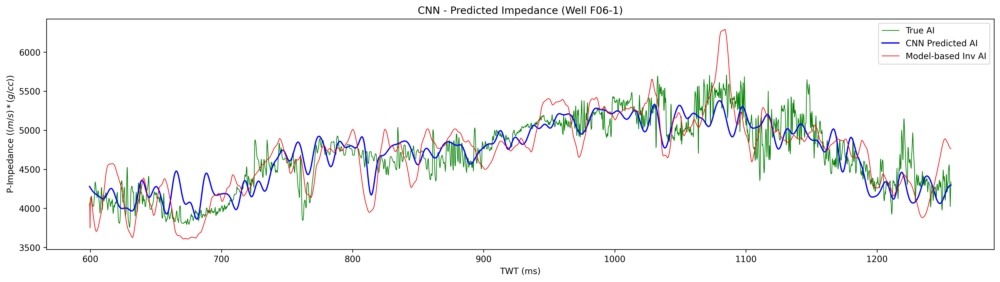

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (20,5))
plt.plot(data_F061['TWT'], y_test, color='g', linewidth=0.8, label = "True AI")
plt.plot(data_F061['TWT'], pred_cnn, "-", color = "b", label = "CNN Predicted AI")
plt.plot(data_F061['TWT'], data_F061['MBI'], color='r', linewidth=0.8, label = "Model-based Inversion AI")

plt.title('CNN - Predicted Impedance (Well F06-1)')
plt.xlabel("TWT (ms)")
plt.ylabel("P-Impedance $((m/s)*(g/cc))$")
plt.legend()
plt.show()

plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (20,5))
plt.plot(data_F061['TWT'], y_test, color='g', linewidth=0.8, label = "True AI")
plt.plot(data_F061['TWT'], filter(pd.DataFrame(pred_cnn)).values, "-", color = "b", label = "CNN Predicted AI")
plt.plot(data_F061['TWT'], data_F061['MBI'], color='r', linewidth=0.8, label = "Model-based Inversion AI")

plt.title('CNN - Predicted Impedance (Well F06-1)')
plt.xlabel("TWT (ms)")
plt.ylabel("P-Impedance $((m/s)*(g/cc))$")
plt.legend()
plt.show()

In [ ]:
import pickle

Pkl_Filename = "/content/drive/My Drive/Final Project/ML Models/model_cnn.pkl"  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(model_cnn, file)

INFO:tensorflow:Assets written to: ram://ae4a05eb-9015-4a28-9d40-303075d37417/assets


# Long-Short Term Memory (LSTM)

In [ ]:
X_train_scaled_lstm = np.array(X_train_scaled).reshape(-1, 1, len(features))
X_test_scaled_lstm  = np.array(X_test_scaled).reshape(-1, 1, len(features))

y_train_scaled_lstm = np.array(y_train_scaled).reshape(-1, 1, 1)
y_test_scaled_lstm = np.array(y_test_scaled).reshape(-1, 1, 1)

X_test_scaled_lstm.shape, y_test_scaled_lstm.shape

((3286, 1, 4), (3286, 1, 1))

In [ ]:
model_lstm = Sequential([
    LSTM(512, input_shape=(1,len(features)), # input shape: (time step, features)
        recurrent_dropout = 0.15, # is a regularization method for recurrent neural networks. 
        return_sequences = True), # refer to return the hidden state
    Dropout(0.2),
    layers.Dense(1, activation='linear')
])

model_lstm.compile(loss="mse", optimizer="adam")

history_lstm = model_lstm.fit(X_train_scaled_lstm, y_train_scaled_lstm, epochs=800,
                    validation_split = 0.2)

model_lstm.evaluate(X_test_scaled_lstm, y_test_scaled_lstm)

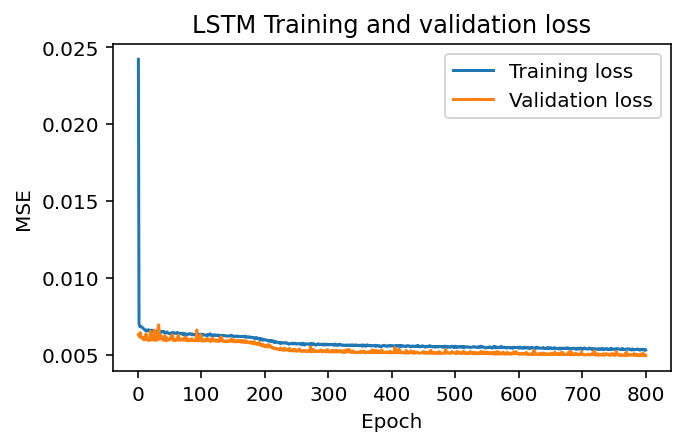

In [ ]:
plt.rcParams['figure.dpi'] = 144
loss = history_lstm.history['loss']
val_loss = history_lstm.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(5, 3))
plt.plot(epochs, loss, label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('LSTM Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Predicting
pred_lstm_scaled = model_lstm.predict(X_test_scaled_lstm)

# Inverse transform
temp1 = pred_lstm_scaled.reshape((pred_lstm_scaled.shape[0], 1))
pred_lstm = scaler_y.inverse_transform(temp1)
pred_lstm = np.array(pred_lstm)

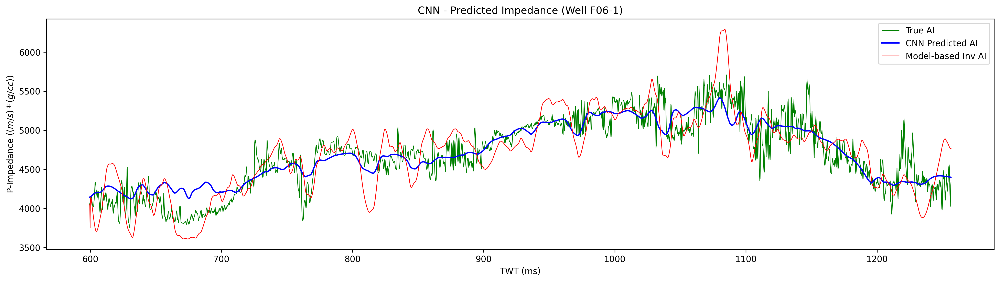

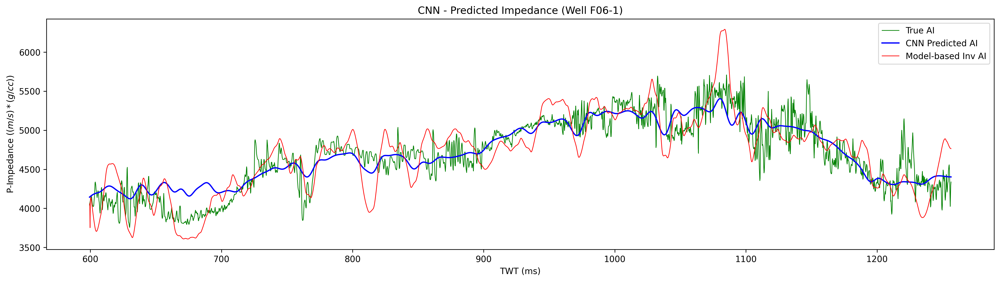

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (20,5))
plt.plot(data_F061['TWT'], y_test, color='g', linewidth=0.8, label = "True AI")
plt.plot(data_F061['TWT'], pred_lstm, "-", color = "b", label = "CNN Predicted AI")
plt.plot(data_F061['TWT'], data_F061['MBI'], color='r', linewidth=0.8, label = "Model-based Inversion AI")

plt.title('LSTM - Predicted Impedance (Well F06-1)')
plt.xlabel("TWT (ms)")
plt.ylabel("P-Impedance $((m/s)*(g/cc))$")
plt.legend()
plt.show()

plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (20,5))
plt.plot(data_F061['TWT'], y_test, color='g', linewidth=0.8, label = "True AI")
plt.plot(data_F061['TWT'], filter(pd.DataFrame(pred_lstm)).values, "-", color = "b", label = "CNN Predicted AI")
plt.plot(data_F061['TWT'], data_F061['MBI'], color='r', linewidth=0.8, label = "Model-based Inversion AI")

plt.title('LSTM - Predicted Impedance (Well F06-1)')
plt.xlabel("TWT (ms)")
plt.ylabel("P-Impedance $((m/s)*(g/cc))$")
plt.legend()
plt.show()

In [ ]:
import pickle

Pkl_Filename = "/content/drive/My Drive/Final Project/ML Models/model_lstm.pkl"  

with open(Pkl_Filename, 'wb') as file:  
    pickle.dump(model_lstm, file)

INFO:tensorflow:Assets written to: ram://948e1efc-0d05-4ef1-a3a9-927d3d6d84f4/assets


# CNN + LSTM

In [ ]:
pred_final = (pred_cnn + pred_lstm)/2

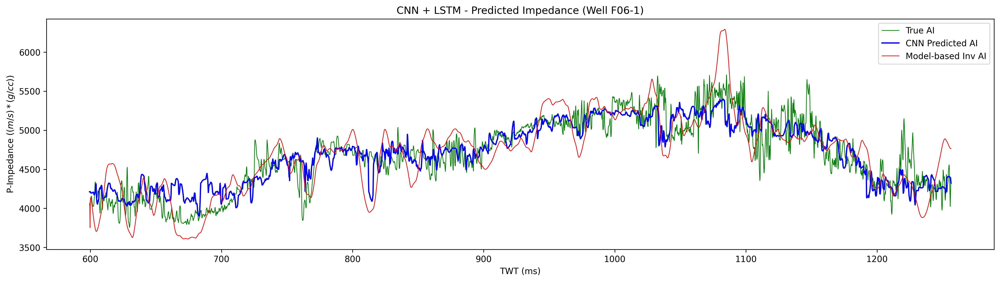

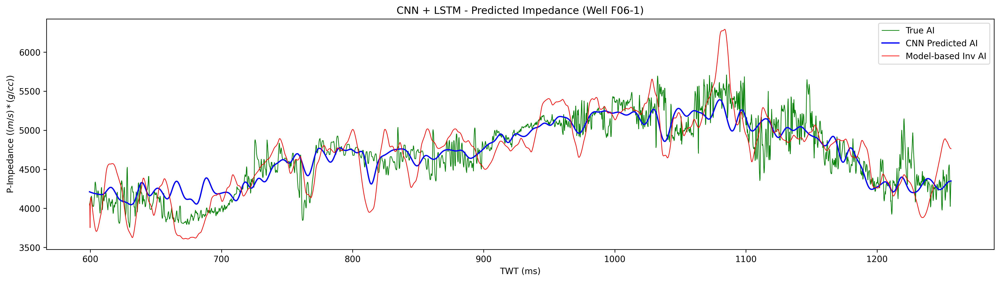

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (20,5))
plt.plot(data_F061['TWT'], y_test, color='g', linewidth=0.8, label = "True AI")
plt.plot(data_F061['TWT'], pred_final, "-", color = "b", label = "CNN Predicted AI")
plt.plot(data_F061['TWT'], data_F061['MBI'], color='r', linewidth=0.8, label = "Model-based Inv AI")

plt.title('CNN + LSTM - Predicted Impedance (Well F06-1)')
plt.xlabel("TWT (ms)")
plt.ylabel("P-Impedance $((m/s)*(g/cc))$")
plt.legend()
plt.show()

plt.rcParams['figure.dpi'] = 300
plt.figure(figsize = (20,5))
plt.plot(data_F061['TWT'], y_test, color='g', linewidth=0.8, label = "True AI")
plt.plot(data_F061['TWT'], filter(pd.DataFrame(pred_final)).values, "-", color = "b", label = "CNN Predicted AI")
plt.plot(data_F061['TWT'], data_F061['MBI'], color='r', linewidth=0.8, label = "Model-based Inv AI")

plt.title('CNN + LSTM - Predicted Impedance (Well F06-1)')
plt.xlabel("TWT (ms)")
plt.ylabel("P-Impedance $((m/s)*(g/cc))$")
plt.legend()
plt.show()

In [ ]:
metrics_df = pd.DataFrame({
    "Corr" : [
        np.corrcoef(y_test.values.flatten(), data_F061['MBI'].values)[0:1][0][1],
        np.corrcoef(y_test.values.flatten(), pred_cnn.flatten())[0:1][0][1],
        np.corrcoef(y_test.values.flatten(), pred_lstm.flatten())[0:1][0][1],
        np.corrcoef(y_test.values.flatten(), pred_final.flatten())[0:1][0][1],
    ],
    
    "MAE" : [
        mean_absolute_error(y_test, data_F061['MBI']),
        mean_absolute_error(y_test, pred_cnn),
        mean_absolute_error(y_test, pred_lstm),
        mean_absolute_error(y_test, pred_final),
    ],
    
    "R2"  : [
        r2_score(y_test, data_F061['MBI']),
        r2_score(y_test, pred_cnn),
        r2_score(y_test, pred_lstm),
        r2_score(y_test, pred_final),
    ],
    
    "ME"  : [
        max_error(y_test, data_F061['MBI']),
        max_error(y_test, pred_cnn),
        max_error(y_test, pred_lstm),
        max_error(y_test, pred_final),
    ],
    
    "MSE" : [
        mean_squared_error(y_test, data_F061['MBI'], squared=True),
        mean_squared_error(y_test, pred_cnn, squared=True),
        mean_squared_error(y_test, pred_lstm, squared=True),
        mean_squared_error(y_test, pred_final, squared=True),
    ],
    
    "RMSE" : [
        mean_squared_error(y_test, data_F061['MBI'], squared=False),
        mean_squared_error(y_test, pred_cnn, squared=False),
        mean_squared_error(y_test, pred_lstm, squared=False),
        mean_squared_error(y_test, pred_final, squared=False),
    ]
})

metrics_df.index = ['MBI', 'CNN', 'LSTM', 'CNN + LSTM']
metrics_df.to_excel('metrics.xlsx')

In [ ]:
metrics_df

,Corr,MAE,R2,ME,MSE,RMSE
MBI,0.823188,224.593249,0.606935,993.250500,79261.658079,281.534470
CNN,0.814281,206.749371,0.650804,1033.750365,70415.518967,265.359226
LSTM,0.902152,153.612908,0.802955,805.884582,39734.152017,199.334272
CNN + LSTM,0.880078,163.318651,0.772665,906.963988,45842.066868,214.107606


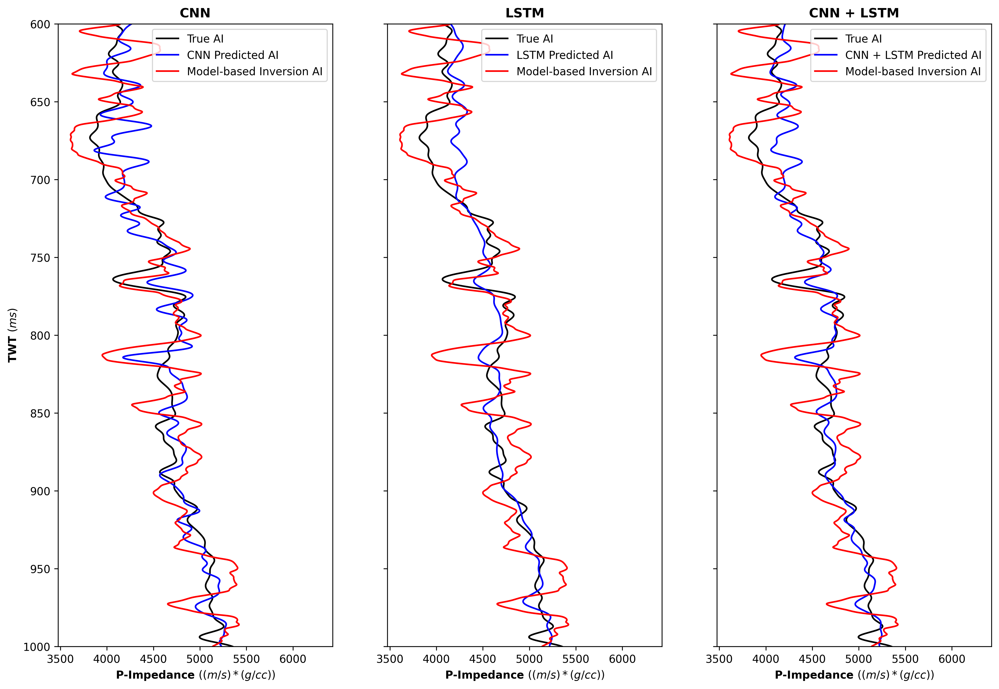

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(15, 10), sharey=True)

ax[0].plot(filter(pd.DataFrame(y_test), cutoff=10).values, data_F061['TWT'], color='k', label = "True AI")
ax[0].plot(filter(pd.DataFrame(pred_cnn)).values, data_F061['TWT'], "-", color = "b", label = "CNN Predicted AI")
ax[0].plot(data_F061['MBI'], data_F061['TWT'], color='red', label = "Model-based Inversion AI")
ax[0].set_title('CNN', fontweight='bold')
ax[0].set_xlabel("P-Impedance $((m/s)*(g/cc))$", fontweight='bold')
ax[0].set_ylabel("TWT $(ms)$", fontweight='bold')
# ax[0].set_ylim(max(data_F061['TWT']), min(data_F061['TWT']) - 35)
ax[0].set_ylim(1000, 600)
ax[0].legend()


ax[1].plot(filter(pd.DataFrame(y_test), cutoff=10).values, data_F061['TWT'], color='k', label = "True AI")
ax[1].plot(filter(pd.DataFrame(pred_lstm)).values, data_F061['TWT'], "-", color = "b", label = "LSTM Predicted AI")
ax[1].plot(data_F061['MBI'], data_F061['TWT'], color='red', label = "Model-based Inversion AI")
ax[1].set_title('LSTM', fontweight='bold')
ax[1].set_xlabel("P-Impedance $((m/s)*(g/cc))$", fontweight='bold')
ax[1].legend()


ax[2].plot(filter(pd.DataFrame(y_test), cutoff=10).values, data_F061['TWT'], color='k', label = "True AI")
ax[2].plot(filter(pd.DataFrame(pred_final)).values, data_F061['TWT'], "-", color = "b", label = "CNN + LSTM Predicted AI")
ax[2].plot(data_F061['MBI'], data_F061['TWT'], color='red', label = "Model-based Inversion AI")
ax[2].set_title('CNN + LSTM', fontweight='bold')
ax[2].set_xlabel("P-Impedance $((m/s)*(g/cc))$", fontweight='bold')
ax[2].legend()

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.2, 
                    hspace=0.3)

plt.show()

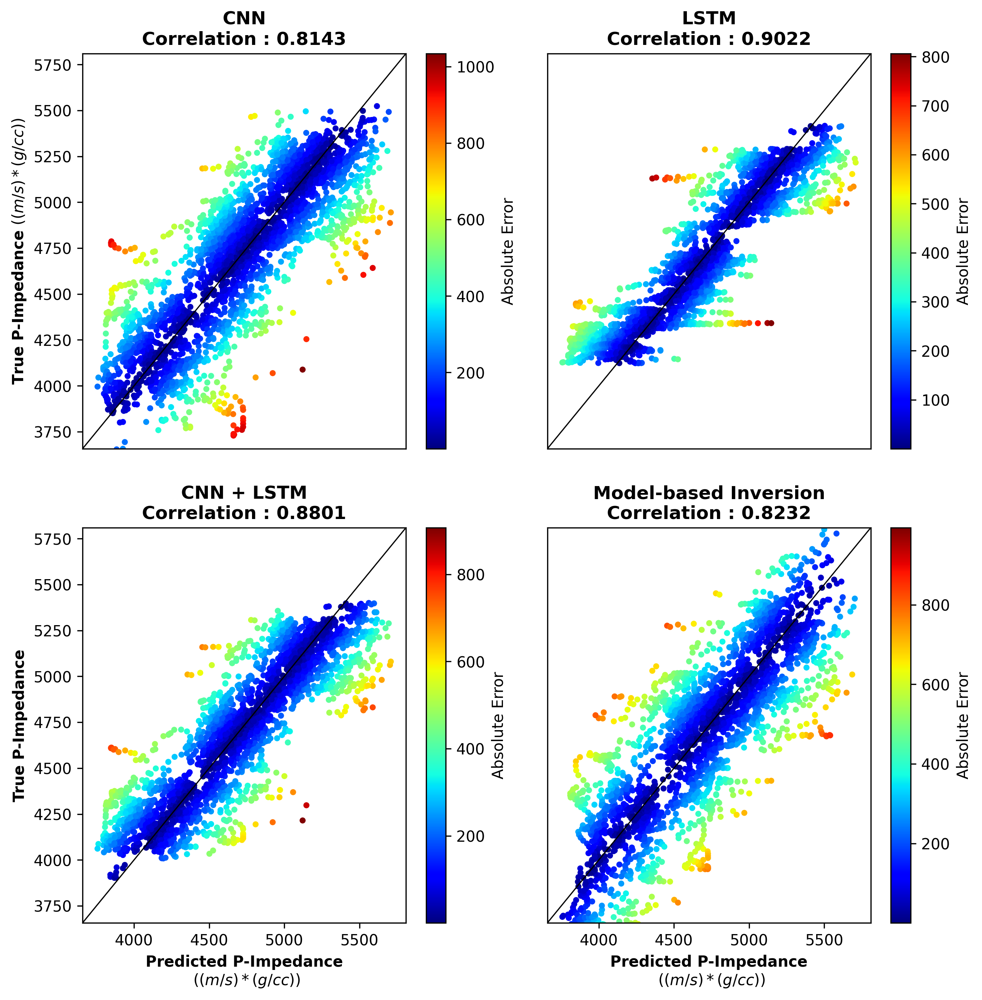

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.figure(figsize=(10, 10))

plt.subplot(221)

cnn_correlation = np.corrcoef(y_test.values.flatten(), pred_cnn.flatten())[0:1][0][1]
lim = [min(y_test.values.flatten()) - 200, max(y_test.values.flatten()) + 200]
fontsize=10
error = []

for i in range(len(y_test.values)):
    error.append(absolute_error(y_test.values[i][0], pred_cnn[i][0]))
    
cnn_correlation = np.corrcoef(y_test.values.flatten(), pred_cnn.flatten())[0:1][0][1]
lim = [min(y_test.values.flatten()) - 100, max(y_test.values.flatten()) + 100]

plt.scatter(y_test, pred_cnn, cmap='jet', c=error, marker='.')
plt.plot((np.linspace(lim[0], lim[1])), (np.linspace(lim[0], lim[1])), color='k', linewidth=0.8)
plt.title(f"CNN\nCorrelation : {'{:.4f}'.format(cnn_correlation)}", fontweight='bold')
plt.ylabel("True P-Impedance $((m/s)*(g/cc))$", fontsize=fontsize, fontweight='bold')
# plt.xlabel("Predicted P-Impedance\n $((m/s)*(g/cc))$", fontsize=fontsize)
plt.xlim(lim[0], lim[1])
plt.ylim(lim[0], lim[1])
plt.xticks([])
# plt.grid(True)
plt.colorbar(label='Absolute Error')


plt.subplot(222)

lstm_correlation = np.corrcoef(y_test.values.flatten(), pred_lstm.flatten())[0:1][0][1]
lim = [min(y_test.values.flatten()) - 200, max(y_test.values.flatten()) + 200]
fontsize=10
error = []

for i in range(len(y_test.values)):
    error.append(absolute_error(y_test.values[i][0], pred_lstm[i][0]))
    
lstm_correlation = np.corrcoef(y_test.values.flatten(), pred_lstm.flatten())[0:1][0][1]
lim = [min(y_test.values.flatten()) - 100, max(y_test.values.flatten()) + 100]

plt.scatter(y_test, pred_lstm, cmap='jet', c=error, marker='.')
plt.plot((np.linspace(lim[0], lim[1])), (np.linspace(lim[0], lim[1])), color='k', linewidth=0.8)
plt.title(f"LSTM\nCorrelation : {'{:.4f}'.format(lstm_correlation)}", fontweight='bold')
plt.xlim(lim[0], lim[1])
plt.ylim(lim[0], lim[1])
# plt.xlabel("Predicted P-Impedance\n $((m/s)*(g/cc))$", fontsize=fontsize)
# plt.ylabel("True P-Impedance", fontsize=fontsize)
plt.xticks([])
plt.yticks([])
# plt.grid(True)
plt.colorbar(label='Absolute Error')


plt.subplot(223)

final_correlation = np.corrcoef(y_test.values.flatten(), pred_final.flatten())[0:1][0][1]
lim = [min(y_test.values.flatten()) - 200, max(y_test.values.flatten()) + 200]
fontsize=10
error = []

for i in range(len(y_test.values)):
    error.append(absolute_error(y_test.values[i][0], pred_final[i][0]))
    
final_correlation = np.corrcoef(y_test.values.flatten(), pred_final.flatten())[0:1][0][1]
lim = [min(y_test.values.flatten()) - 100, max(y_test.values.flatten()) + 100]

plt.scatter(y_test, pred_final, cmap='jet', c=error, marker='.')
plt.plot((np.linspace(lim[0], lim[1])), (np.linspace(lim[0], lim[1])), color='k', linewidth=0.8)
plt.title(f"CNN + LSTM\nCorrelation : {'{:.4f}'.format(final_correlation)}", fontweight='bold')
plt.xlim(lim[0], lim[1])
plt.ylim(lim[0], lim[1])
plt.xlabel("Predicted P-Impedance\n $((m/s)*(g/cc))$", fontsize=fontsize, fontweight='bold')
plt.ylabel("True P-Impedance", fontsize=fontsize, fontweight='bold')
# plt.yticks([])
# plt.grid(True)
plt.colorbar(label='Absolute Error')


plt.subplot(224)

lim = [min(y_test.values.flatten()) - 200, max(data_F061['MBI'].values) + 200]
fontsize=10
error = []

for i in range(len(y_test.values)):
    error.append(absolute_error(y_test.values[i][0], data_F061['MBI'].values[i]))
    
mbi_correlation = np.corrcoef(y_test.values.flatten(), data_F061['MBI'].values)[0:1][0][1]
lim = [min(y_test.values.flatten()) - 100, max(y_test.values.flatten()) + 100]

plt.scatter(y_test, data_F061['MBI'], cmap='jet', c=error, marker='.')
plt.plot((np.linspace(lim[0], lim[1])), (np.linspace(lim[0], lim[1])), color='k', linewidth=0.8)
plt.title(f"Model-based Inversion\nCorrelation : {'{:.4f}'.format(mbi_correlation)}", fontweight='bold')
plt.xlabel("Predicted P-Impedance\n $((m/s)*(g/cc))$", fontsize=fontsize, fontweight='bold')
# plt.ylabel("True P-Impedance", fontsize=fontsize)
plt.xlim(lim[0], lim[1])
plt.ylim(lim[0], lim[1])
plt.yticks([])
# plt.xticks([])
# plt.grid(True)
plt.colorbar(label='Absolute Error')

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.15, 
                    hspace=0.2)

plt.show()

# Cross-Section Prediction

In [ ]:
def transform_data(data):
    return scaler_x.fit_transform(data)

In [ ]:
model_pwave             = '/content/drive/My Drive/Final Project/Data F021-F061/Low_Freq_Model_P-wave.sgy'
amp_env                 = '/content/drive/My Drive/Final Project/Data F021-F061/Amplitude_Envelope.sgy'
quad                    = '/content/drive/My Drive/Final Project/Data F021-F061/Quadrature_Trace.sgy'
seismic                 = '/content/drive/My Drive/Final Project/Data F021-F061/2DLine_F061-F021_.sgy'

model_pwave_            = load_data(model_pwave)
amp_env_                = load_data(amp_env)
quad_                   = load_data(quad)
seismic_                = load_data(seismic)

In [168]:
uplim, downlim = 3100, 6000
step = 1

model_pwave_cropped            = pd.DataFrame(model_pwave_[uplim:downlim, :]).iloc[::step]
amp_env_cropped                = pd.DataFrame(amp_env_[uplim:downlim, :]).iloc[::step]
quad_cropped                   = pd.DataFrame(quad_[uplim:downlim, :]).iloc[::step]
seismic_cropped                = pd.DataFrame(seismic_[uplim:downlim, :]).iloc[::step]

In [169]:
model_pwave_cropped_scaled = scaling_col_values(
    model_pwave_cropped,
    min_val=min(model_pwave_cropped.values.flatten()),
    max_val=max(model_pwave_cropped.values.flatten())
)

amp_env_cropped_scaled = scaling_col_values(
    amp_env_cropped,
    min_val=min(amp_env_cropped.values.flatten()),
    max_val=max(amp_env_cropped.values.flatten())
)

seismic_cropped_scaled = scaling_col_values(
    seismic_cropped,
    min_val=min(seismic_cropped.values.flatten()),
    max_val=max(seismic_cropped.values.flatten()) 
)

quad_cropped_scaled = scaling_col_values(
    quad_cropped,
    min_val=min(quad_cropped.values.flatten()),
    max_val=max(quad_cropped.values.flatten()) 
)

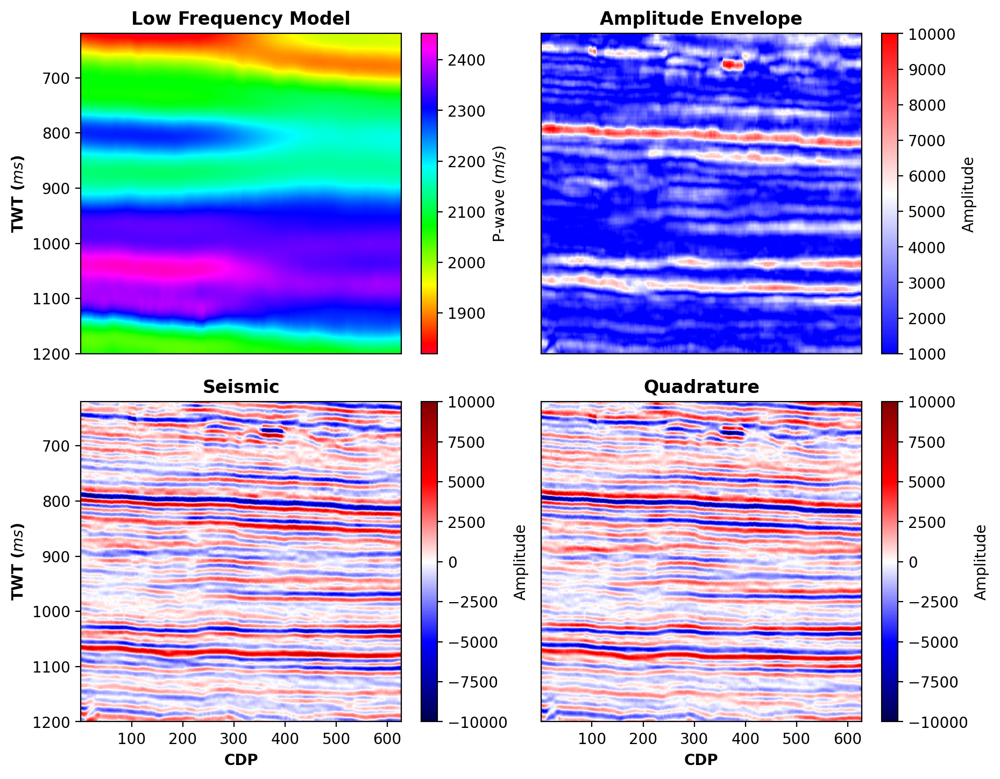

In [170]:
plt.figure(figsize=(10, 8))


plt.subplot(221)
plt.imshow(
    model_pwave_cropped.values,
    cmap='gist_rainbow',
    interpolation='bilinear',
    aspect='auto',
    extent=[
        1, 627, 
        dataset_F032[dataset_F032.index==downlim]['TWT'].values[0], 
        dataset_F032[dataset_F032.index==uplim]['TWT'].values[0]
    ]
)

plt.colorbar(label='P-wave $(m/s)$')
plt.title('Low Frequency Model', fontweight='bold')
plt.ylabel('TWT ($ms$)', fontweight='bold')
plt.xticks([])
plt.grid(False)


plt.subplot(222)
plt.imshow(amp_env_cropped.values, vmin=1000, vmax=10000, cmap='bwr', interpolation='bilinear', aspect='auto')
plt.colorbar(label='Amplitude')
plt.title('Amplitude Envelope', fontweight='bold')
plt.xticks([])
plt.yticks([])
plt.grid(False)


plt.subplot(223)
plt.imshow(
    seismic_cropped.values, vmin=-10000, vmax=10000, cmap='seismic', interpolation='bilinear', aspect='auto',
    extent=[1, 627, 
            dataset_F032[dataset_F032.index==downlim]['TWT'].values[0],
            dataset_F032[dataset_F032.index==uplim]['TWT'].values[0]]
)
plt.colorbar(label='Amplitude')
plt.title('Seismic', fontweight='bold')
plt.xlabel('CDP', fontweight='bold')
plt.ylabel('TWT ($ms$)', fontweight='bold')
# plt.yticks([])
plt.grid(False)


plt.subplot(224)
plt.imshow(
    quad_cropped.values, vmin=-10000, vmax=10000, cmap='seismic', interpolation='bilinear', aspect='auto',
    extent=[1, 627, 
        dataset_F032[dataset_F032.index==downlim]['TWT'].values[0],
        dataset_F032[dataset_F032.index==uplim]['TWT'].values[0]]
)
plt.colorbar(label='Amplitude')
plt.title('Quadrature', fontweight='bold')
plt.xlabel('CDP', fontweight='bold')
plt.yticks([])
plt.grid(False)


plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.15, 
                    hspace=0.15)

plt.show()

In [171]:
features

['LFM_PW', 'SEISMIC', 'QUAD', 'AMP_ENV']

In [172]:
full_data = np.stack(
    (
       model_pwave_cropped_scaled,
       seismic_cropped_scaled,
       quad_cropped_scaled,
       amp_env_cropped_scaled,
    ), axis=2
)

In [173]:
predicted_value_cnn = []
predicted_value_lstm = []


for i in range(full_data.shape[1]):
  
  test_cnn = np.array(full_data[:, i, :]).reshape(
        full_data[:, i, :].shape[0], full_data[:, i, :].shape[1], 1
    )
  pred_val_cnn = model_cnn.predict(test_cnn)
  pred_val_cnn = scaler_y.inverse_transform(pred_val_cnn.reshape(-1, 1))
  pred_val_cnn = filter(pred_val_cnn)
  predicted_value_cnn.append(pred_val_cnn)


  test_lstm  = np.array(full_data[:, i, :]).reshape(-1, 1, len(features))
  pred_val_lstm = model_lstm.predict(test_lstm)
  pred_val_lstm = scaler_y.inverse_transform(pred_val_lstm.reshape(-1, 1))
  pred_val_lstm = filter(pred_val_lstm)
  predicted_value_lstm.append(pred_val_lstm)

In [174]:
predicted_value_cnn_reshaped = np.array(predicted_value_cnn).reshape(full_data.shape[1], full_data.shape[0]).T
predicted_value_lstm_reshaped = np.array(predicted_value_lstm).reshape(full_data.shape[1], full_data.shape[0]).T
predicted_value_final_reshaped = (predicted_value_cnn_reshaped + predicted_value_lstm_reshaped)/2

In [175]:
mbi = pd.DataFrame(load_data('/content/drive/My Drive/Final Project/Data F021-F061/model_based_inversion.sgy')[uplim:downlim, :]).iloc[::step]

SegyPY0.57:  readSegy : Trying to read /content/drive/My Drive/Final Project/Data F021-F061/model_based_inversion.sgy
SegyPY0.57:  getSegyHeader : succesfully read /content/drive/My Drive/Final Project/Data F021-F061/model_based_inversion.sgy
SegyPY0.57:  filesize=7556012
SegyPY0.57:  bps=    4
SegyPY0.57:  nd=1888103
SegyPY0.57:  readSegyData : Reading segy data
SegyPY0.57:  readSegyData : SEG-Y revision = 1
SegyPY0.57:  readSegyData : DataSampleFormat=1(IBM Float)
SegyPY0.57:   ns=9241
SegyPY0.57:  readSegyData : Finished reading segy data


In [221]:
horizons = pd.read_excel('/content/drive/My Drive/Final Project/Data F021-F061/F061-F021_Horizons.xlsx')
horizons.tail()

,CDP,FS1,FS2,FS3,FS4,FS7,FS8,FS11,MFS2,MFS4,MFS8,MFS9,MFS10,MFS11,MMU,Top Foresets,Truncation
198,199,1225.650,1133.468,1124.641,1118.471,942.269,809.143,625.370,1148.606,1084.399,762.482,736.650,715.954,603.241,1265.510,1063.354,1021.219
199,200,1225.989,1133.368,1124.965,1118.649,941.508,809.070,625.597,1148.397,1084.135,762.652,736.314,716.146,603.050,1267.408,1063.628,1021.314
200,201,1226.214,1133.060,1124.921,1118.111,940.761,808.995,625.827,1148.374,1083.700,762.875,735.912,716.414,602.055,1270.292,1063.426,1020.542
201,202,1226.478,1133.332,1125.504,1117.818,940.417,809.313,626.053,1148.573,1083.767,763.188,735.517,716.553,602.398,1272.530,1063.341,1020.148
202,203,1226.704,1133.468,1125.625,1117.854,940.417,809.398,626.053,1148.773,1083.567,763.478,735.287,716.648,602.250,1272.530,1063.387,1020.386


In [222]:
CDP = horizons['CDP']
FS1 = horizons['FS1']
FS2 = horizons['FS2']
FS3 = horizons['FS3']
FS4 = horizons['FS4']
FS7 = horizons['FS7']
FS8 = horizons['FS8']
FS11 = horizons['FS11']
MFS2 = horizons['MFS2']
MFS4 = horizons['MFS4']
MFS8 = horizons['MFS8']
MFS9 = horizons['MFS9']
MFS10 = horizons['MFS10']
MFS11 = horizons['MFS11']
MMU = horizons['MMU']
Top = horizons['Top Foresets']
Trunc = horizons['Truncation']

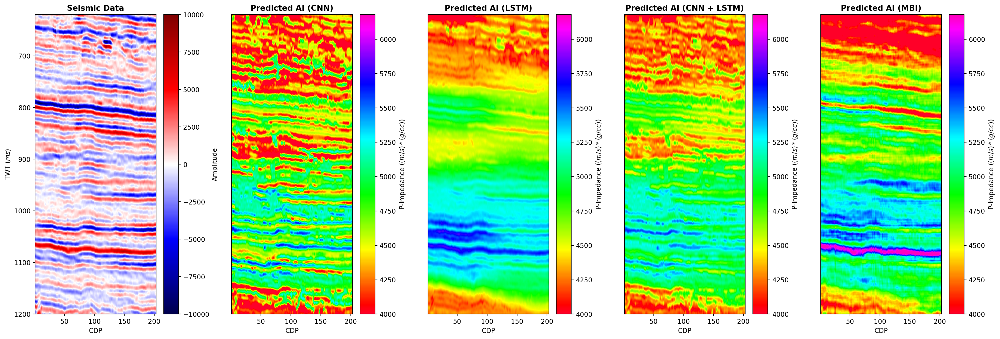

In [229]:
plt.figure(figsize=(25, 8))

plt.subplot(151)

plt.imshow(
    seismic_cropped, vmin=-10000, vmax=10000,
    cmap='seismic', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1], 
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)


plt.xlabel('CDP')
plt.ylabel('TWT ($ms$)')
plt.title('Seismic Data', fontweight='bold')
plt.colorbar(label='Amplitude')
plt.grid(False)


plt.subplot(152)

plt.imshow(
    predicted_value_cnn_reshaped, vmin=4000, vmax=6179,
    cmap='gist_rainbow', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1], 
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.title('Predicted AI (CNN)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='P-Impedance $((m/s)*(g/cc))$')
plt.grid(False)


plt.subplot(153)

plt.imshow(
    predicted_value_lstm_reshaped, vmin=4000, vmax=6179,
    cmap='gist_rainbow', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1], 
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.title('Predicted AI (LSTM)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='P-Impedance $((m/s)*(g/cc))$')
plt.grid(False)


plt.subplot(154)

plt.imshow(
    predicted_value_final_reshaped, vmin=4000, vmax=6179,
    cmap='gist_rainbow', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1],
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.title('Predicted AI (CNN + LSTM)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='P-Impedance $((m/s)*(g/cc))$')
plt.grid(False)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.15)

plt.subplot(155)

plt.imshow(
    mbi, vmin=4000, vmax=6179,
    cmap='gist_rainbow', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1],
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.title('Predicted AI (MBI)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='P-Impedance $((m/s)*(g/cc))$')
plt.grid(False)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.15)

plt.show()


# Seismic Forward Modelling

In [178]:
def ref_coef(data):
    rc_val = []
    for i in range(len(data)-1):
        rc = (data[i+1] - data[i])/(data[i+1] + data[i])
        rc_val.append(rc)
    return rc_val

def fm(data, wavelet):
    rc = ref_coef(data)
    return np.convolve(rc, wavelet, mode='same')

In [179]:
wavelet = np.loadtxt('/content/drive/My Drive/Final Project/Data F021-F061/wavelet.txt')

In [180]:
mbi_fm_val = []
cnn_fm_val = []
lstm_fm_val = []
final_fm_val = []

cnn = predicted_value_cnn_reshaped
lstm = predicted_value_lstm_reshaped
final = predicted_value_final_reshaped

for i in range(seismic_.shape[1]):
    mbi_fm_val.append(fm(mbi.values[:, i], wavelet))
    cnn_fm_val.append(fm(cnn[:, i], wavelet))
    lstm_fm_val.append(fm(lstm[:, i], wavelet))
    final_fm_val.append(fm(final[:, i], wavelet))

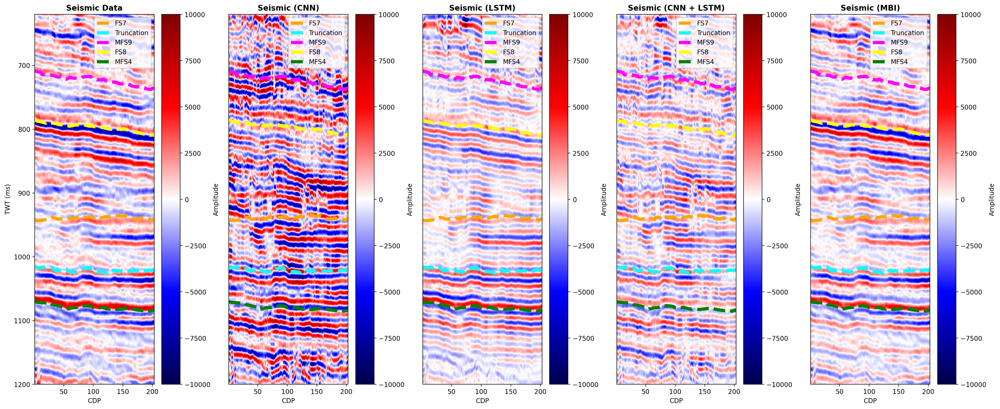

In [235]:
plt.figure(figsize=(25, 10))

plt.subplot(151)

plt.imshow(
    seismic_cropped, vmin=-10000, vmax=10000,
    cmap='seismic', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1], 
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.plot(CDP, FS7, color='orange', linestyle='--', linewidth='5', label='FS7')
plt.plot(CDP, Trunc, color='cyan', linestyle='--', linewidth='5', label='Truncation')
plt.plot(CDP, MFS9, color='magenta', linestyle='--', linewidth='5', label='MFS9')
plt.plot(CDP, FS8, color='yellow', linestyle='--', linewidth='5', label='FS8')
plt.plot(CDP, MFS4, color='green', linestyle='--', linewidth='5', label='MFS4')
plt.legend(loc='1', prop={'size': 10})
plt.xlabel('CDP')
plt.ylabel('TWT ($ms$)')
plt.title('Seismic Data', fontweight='bold')
# plt.legend()
plt.colorbar(label='Amplitude')
plt.grid(False)


plt.subplot(152)

plt.imshow(
    np.array(cnn_fm_val).T, vmin=-10000, vmax=10000,
    cmap='seismic', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1], 
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.plot(CDP, FS7, color='orange', linestyle='--', linewidth='5', label='FS7')
plt.plot(CDP, Trunc, color='cyan', linestyle='--', linewidth='5', label='Truncation')
plt.plot(CDP, MFS9, color='magenta', linestyle='--', linewidth='5', label='MFS9')
plt.plot(CDP, FS8, color='yellow', linestyle='--', linewidth='5', label='FS8')
plt.plot(CDP, MFS4, color='green', linestyle='--', linewidth='5', label='MFS4')
plt.legend(loc='1', prop={'size': 10})
plt.title('Seismic (CNN)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='Amplitude')
plt.grid(False)


plt.subplot(153)

plt.imshow(
    np.array(lstm_fm_val).T * 2, vmin=-10000, vmax=10000,
    cmap='seismic', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1], 
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.plot(CDP, FS7, color='orange', linestyle='--', linewidth='5', label='FS7')
plt.plot(CDP, Trunc, color='cyan', linestyle='--', linewidth='5', label='Truncation')
plt.plot(CDP, MFS9, color='magenta', linestyle='--', linewidth='5', label='MFS9')
plt.plot(CDP, FS8, color='yellow', linestyle='--', linewidth='5', label='FS8')
plt.plot(CDP, MFS4, color='green', linestyle='--', linewidth='5', label='MFS4')
plt.legend(loc='1', prop={'size': 10})
plt.title('Seismic (LSTM)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='Amplitude')
plt.grid(False)


plt.subplot(154)

# plt.imshow(
#     np.array(final_fm_val).T, vmin=-10000, vmax=10000,
#     cmap='seismic', aspect='auto', interpolation='bilinear',
#     extent=[1, seismic_cropped.shape[1],
#             dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
#             dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
# )

# plt.title('Seismic (CNN + LSTM)', fontweight='bold')
# plt.xlabel('CDP')
# # plt.ylabel('TWT ($ms$)')
# # plt.legend()
# plt.yticks([])
# plt.colorbar(label='Amplitude')
# plt.grid(False)

plt.imshow(
    (np.array(cnn_fm_val).T + np.array(lstm_fm_val).T * 2)/2, vmin=-10000, vmax=10000,
    cmap='seismic', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1],
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.plot(CDP, FS7, color='orange', linestyle='--', linewidth='5', label='FS7')
plt.plot(CDP, Trunc, color='cyan', linestyle='--', linewidth='5', label='Truncation')
plt.plot(CDP, MFS9, color='magenta', linestyle='--', linewidth='5', label='MFS9')
plt.plot(CDP, FS8, color='yellow', linestyle='--', linewidth='5', label='FS8')
plt.plot(CDP, MFS4, color='green', linestyle='--', linewidth='5', label='MFS4')
plt.legend(loc='1', prop={'size': 10})
plt.title('Seismic (CNN + LSTM)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='Amplitude')
plt.grid(False)


plt.subplot(155)

plt.imshow(
    np.array(mbi_fm_val).T, vmin=-10000, vmax=10000,
    cmap='seismic', aspect='auto', interpolation='bilinear',
    extent=[1, seismic_cropped.shape[1],
            dataset_F061[dataset_F061.index==downlim]['TWT'].values[0], 
            dataset_F061[dataset_F061.index==uplim]['TWT'].values[0]]
)

plt.plot(CDP, FS7, color='orange', linestyle='--', linewidth='5', label='FS7')
plt.plot(CDP, Trunc, color='cyan', linestyle='--', linewidth='5', label='Truncation')
plt.plot(CDP, MFS9, color='magenta', linestyle='--', linewidth='5', label='MFS9')
plt.plot(CDP, FS8, color='yellow', linestyle='--', linewidth='5', label='FS8')
plt.plot(CDP, MFS4, color='green', linestyle='--', linewidth='5', label='MFS4')
plt.legend(loc='1', prop={'size': 10})
plt.title('Seismic (MBI)', fontweight='bold')
plt.xlabel('CDP')
# plt.ylabel('TWT ($ms$)')
# plt.legend()
plt.yticks([])
plt.colorbar(label='Amplitude')
plt.grid(False)

plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.15)

plt.show()
